## Imports and Preprocessing

In [ ]:
# Fixes for matplotlib
%matplotlib inline

In [25]:
import os
import math
import glob
import tqdm
import random
import requests
import zipfile

import numpy as np
import matplotlib.pyplot as plt
import cv2
import ultralytics
import imutils
import torch
from imutils import paths
from PIL import Image
from ultralytics import YOLO

In [26]:
# Specifying the data directories and classes
train_imgs_dir = 'dataset/images/train'
train_labels_dir = 'dataset/labels/train'
val_imgs_dir = 'dataset/images/val'
val_labels_dir = 'dataset/labels/val'
test_imgs_dir = 'dataset/images/test'
test_labels_dir = 'dataset/labels/test'
classes = ['Person', 'Car', 'Bicycle', 'OtherVechicle', 'DontCare']
colors = np.random.uniform(0, 255, size=(len(classes), 3))

In [27]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [28]:
# Overlaying the bounding boxes on the image
def plot_box(image, bboxes, labels, classes=classes, colors=colors, pos='above'):

    # Need the image height and width to denormalize the bounding box coordinates
    height, width, _ = image.shape
    lw = max(round(sum(image.shape) / 2 * 0.003), 2)  # Line width.
    tf = max(lw - 1, 1) # Font thickness.

    # Loop through the bounding boxes and labels
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)

        # Denormalize the coordinates
        xmin = int(x1*width)
        ymin = int(y1*height)
        xmax = int(x2*width)
        ymax = int(y2*height)

        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
        class_name = classes[int(labels[box_num])]
        color=colors[classes.index(class_name)]
        
        cv2.rectangle(
            image, 
            p1, p2,
            color=color, 
            thickness=lw,
            lineType=cv2.LINE_AA
        ) 

        # For filled rectangle.
        w, h = cv2.getTextSize(
            class_name, 
            0, 
            fontScale=lw / 3, 
            thickness=tf
        )[0]

        outside = p1[1] - h >= 3
        
        if pos == 'above':
            p2 = p1[0] + w, p1[1] - h - 3 if outside else p1[1] + h + 3
            cv2.rectangle(
                image, 
                p1, p2, 
                color=color, 
                thickness=-1, 
                lineType=cv2.LINE_AA
            )  
            cv2.putText(
                image, 
                class_name, 
                (p1[0], p1[1] - 5 if outside else p1[1] + h + 2),
                cv2.FONT_HERSHEY_SIMPLEX, 
                fontScale=lw/3.5, 
                color=(255, 255, 255), 
                thickness=tf, 
                lineType=cv2.LINE_AA
            )
        else:
            new_p2 = p1[0] + w, p2[1] + h + 3 if outside else p2[1] - h - 3
            cv2.rectangle(
                image, 
                (p1[0], p2[1]), new_p2, 
                color=color, 
                thickness=-1, 
                lineType=cv2.LINE_AA
            )  
            cv2.putText(
                image, 
                class_name, 
                (p1[0], p2[1] + h + 2 if outside else p2[1]),
                cv2.FONT_HERSHEY_SIMPLEX, 
                fontScale=lw/3, 
                color=(255, 255, 255), 
                thickness=tf, 
                lineType=cv2.LINE_AA
            )
    return image

In [29]:
# Function to plot images with the bounding boxes.
def plot(image_path, label_path, num_samples, classes=classes, colors=colors, pos='above'):
    all_training_images = glob.glob(image_path+'/*')
    all_training_labels = glob.glob(label_path+'/*')
    all_training_images.sort()
    all_training_labels.sort()
    
    temp = list(zip(all_training_images, all_training_labels))
    random.shuffle(temp)
    all_training_images, all_training_labels = zip(*temp)
    all_training_images, all_training_labels = list(all_training_images), list(all_training_labels)
    
    num_images = len(all_training_images)
    
    if num_samples == -1:
        num_samples = num_images
    
    num_cols = 2
    num_rows = int(math.ceil(num_samples / num_cols))
        
    plt.figure(figsize=(10 * num_cols, 6 * num_rows))
    for i in range(num_samples):
        image_name = all_training_images[i].split(os.path.sep)[-1]
        image = cv2.imread(all_training_images[i])
        with open(all_training_labels[i], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label, x_c, y_c, w, h = label_line.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels, classes, colors, pos)
        plt.subplot(num_rows, num_cols, i+1) # Visualize 2x2 grid of images.
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

## Training the model

In [6]:
# Disable wandb
os.environ['WANDB_DISABLED'] = 'true'

In [7]:
# Load YOLO (Pre-trained, to fine-tune)
model = YOLO('models/yolo11n.pt')

In [ ]:
# ONLY RUN if dataset.yaml is not created in the main directory
%%writefile dataset.yaml

path: /home/ashish/Projects/thermal-analysis/dataset
train: images/train
val: images/val
test: images/test
names:
  0: Person
  1: Car
  2: Bicycle
  3: OtherVehicle
  4: DontCare
nc: 5

In [8]:
# Clear Cache and Train the model
torch.cuda.empty_cache()

results = model.train(
    device=torch.device('cuda' if torch.cuda.is_available() else 'cpu'),
    # device=torch.device('cpu'),
    data='dataset.yaml',
    imgsz=384,
    epochs=50,
    batch=16,
    name='yolo11n_50epochs',
    amp=True
)

engine/trainer: task=detect, mode=train, model=models/yolo11n.pt, data=dataset.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=384, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=yolo11n_50epochs, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, optimize=False, int8=

train: Scanning /home/ashish/Projects/thermal-analysis/dataset/labels/train.cache... 2008 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2008/2008 [00:00<?, ?it/s]
val: Scanning /home/ashish/Projects/thermal-analysis/dataset/labels/val.cache... 287 images, 0 backgrounds, 0 corrupt: 100%|██████████| 287/287 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolo11n_50epochs/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 384 train, 384 val
Using 8 dataloader workers
Logging results to runs/detect/yolo11n_50epochs
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      1.16G      1.898      2.822      1.098        151        384: 100%|██████████| 126/126 [00:07<00:00, 17.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.03it/s]

                   all        287       2460      0.705      0.229      0.256      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      1.14G       1.81      1.548      1.041        164        384: 100%|██████████| 126/126 [00:07<00:00, 16.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  8.87it/s]

                   all        287       2460      0.775      0.343      0.357      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      1.17G      1.731      1.363       1.01         97        384: 100%|██████████| 126/126 [00:07<00:00, 16.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  8.34it/s]

                   all        287       2460      0.793      0.345      0.369      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      1.17G      1.692      1.281      1.014         40        384: 100%|██████████| 126/126 [00:07<00:00, 17.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00, 10.45it/s]

                   all        287       2460      0.791      0.351      0.374      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      1.14G      1.671      1.213     0.9897        139        384: 100%|██████████| 126/126 [00:05<00:00, 21.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.99it/s]

                   all        287       2460      0.804      0.368       0.39      0.191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      1.26G      1.588      1.131     0.9861        100        384: 100%|██████████| 126/126 [00:07<00:00, 16.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  7.65it/s]

                   all        287       2460      0.802      0.384      0.403      0.208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      1.14G      1.599      1.139     0.9869         69        384: 100%|██████████| 126/126 [00:07<00:00, 16.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00, 10.09it/s]

                   all        287       2460      0.821      0.367      0.401      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      1.14G      1.569      1.072      0.971        111        384: 100%|██████████| 126/126 [00:06<00:00, 18.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00, -18.15it/s]

                   all        287       2460      0.835      0.383      0.434      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      1.11G      1.542      1.021     0.9673        140        384: 100%|██████████| 126/126 [00:07<00:00, 17.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  7.56it/s]

                   all        287       2460      0.817       0.46      0.484       0.26



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      1.15G      1.527      1.012     0.9634         86        384: 100%|██████████| 126/126 [00:07<00:00, 17.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00, 10.58it/s]

                   all        287       2460      0.782      0.413      0.462      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      1.15G      1.496     0.9686     0.9568         92        384: 100%|██████████| 126/126 [00:07<00:00, 17.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  8.69it/s]

                   all        287       2460      0.756      0.429      0.486      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      1.26G      1.472     0.9533     0.9511         71        384: 100%|██████████| 126/126 [00:07<00:00, 17.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.33it/s]

                   all        287       2460      0.718      0.447      0.546        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      1.07G      1.499     0.9383     0.9493        125        384: 100%|██████████| 126/126 [00:07<00:00, 16.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00, 10.12it/s]

                   all        287       2460      0.705      0.426      0.486      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      1.23G      1.458     0.9298     0.9476         92        384: 100%|██████████| 126/126 [00:07<00:00, 17.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.92it/s]

                   all        287       2460       0.61      0.528      0.544      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      1.13G      1.446     0.8979     0.9439         63        384: 100%|██████████| 126/126 [00:07<00:00, 17.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.67it/s]

                   all        287       2460      0.575      0.519      0.525      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      1.09G      1.444     0.9043     0.9424         74        384: 100%|██████████| 126/126 [00:05<00:00, 22.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00, 10.76it/s]

                   all        287       2460      0.643      0.481      0.546      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      1.11G      1.437     0.8872     0.9443        141        384: 100%|██████████| 126/126 [00:07<00:00, 17.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  8.00it/s]

                   all        287       2460      0.483      0.518      0.521      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      1.21G      1.432     0.8702     0.9384         98        384: 100%|██████████| 126/126 [00:06<00:00, 18.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.49it/s]

                   all        287       2460      0.754      0.451      0.527      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      1.14G      1.423     0.8725     0.9384         95        384: 100%|██████████| 126/126 [00:07<00:00, 17.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00, 10.53it/s]

                   all        287       2460       0.61      0.559      0.578      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      1.23G      1.404     0.8492     0.9317        141        384: 100%|██████████| 126/126 [00:06<00:00, 20.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  8.03it/s]

                   all        287       2460      0.538      0.561      0.557      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      1.16G      1.378     0.8262     0.9288         80        384: 100%|██████████| 126/126 [00:08<00:00, 15.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  7.44it/s]

                   all        287       2460       0.65      0.522      0.578      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50       1.2G       1.41     0.8284      0.928        187        384: 100%|██████████| 126/126 [00:07<00:00, 16.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.16it/s]

                   all        287       2460      0.679      0.495      0.573      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      1.02G      1.365     0.8134     0.9265        106        384: 100%|██████████| 126/126 [00:05<00:00, 22.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.55it/s]

                   all        287       2460      0.745      0.509      0.591      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50       1.2G      1.407     0.8225     0.9253        107        384: 100%|██████████| 126/126 [00:07<00:00, 17.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.89it/s]

                   all        287       2460      0.618      0.544        0.6      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      1.09G      1.356     0.7936     0.9199        125        384: 100%|██████████| 126/126 [00:07<00:00, 16.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.85it/s]

                   all        287       2460      0.629      0.546      0.608      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      1.08G      1.354      0.793     0.9203        103        384: 100%|██████████| 126/126 [00:06<00:00, 18.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  8.71it/s]

                   all        287       2460      0.679      0.484      0.573      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      1.23G      1.333     0.7745     0.9181         98        384: 100%|██████████| 126/126 [00:05<00:00, 21.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.71it/s]

                   all        287       2460      0.684      0.562      0.624      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      1.09G      1.334     0.7778     0.9211        100        384: 100%|██████████| 126/126 [00:06<00:00, 18.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00, 10.40it/s]

                   all        287       2460      0.722      0.604      0.647      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      1.11G      1.351     0.7818     0.9147        164        384: 100%|██████████| 126/126 [00:07<00:00, 17.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.77it/s]

                   all        287       2460      0.619      0.674       0.63      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      1.17G      1.332     0.7747     0.9103        137        384: 100%|██████████| 126/126 [00:07<00:00, 17.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.05it/s]

                   all        287       2460      0.705      0.582      0.639      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      1.19G      1.323     0.7537     0.9127        160        384: 100%|██████████| 126/126 [00:05<00:00, 22.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00, 10.81it/s]

                   all        287       2460      0.637      0.566      0.609      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      1.12G      1.295     0.7442       0.91         75        384: 100%|██████████| 126/126 [00:07<00:00, 16.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00, 10.09it/s]

                   all        287       2460      0.682        0.6      0.642      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      1.09G       1.32      0.751     0.9075        142        384: 100%|██████████| 126/126 [00:07<00:00, 17.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00, 10.68it/s]

                   all        287       2460      0.679      0.673      0.666        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      1.11G      1.265     0.7171     0.9043        124        384: 100%|██████████| 126/126 [00:06<00:00, 18.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  7.95it/s]

                   all        287       2460      0.658      0.639      0.673      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      1.26G      1.289     0.7228     0.9038        153        384: 100%|██████████| 126/126 [00:06<00:00, 20.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.62it/s]

                   all        287       2460      0.723      0.705      0.686      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      1.03G       1.29     0.7287     0.9018         81        384: 100%|██████████| 126/126 [00:07<00:00, 17.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00, 10.10it/s]

                   all        287       2460      0.697       0.61      0.664      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50       1.3G      1.273       0.72     0.8995        101        384: 100%|██████████| 126/126 [00:07<00:00, 17.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00, 10.62it/s]

                   all        287       2460      0.623      0.698      0.685      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      1.16G       1.26     0.7169      0.902         84        384: 100%|██████████| 126/126 [00:06<00:00, 18.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00, 10.55it/s]

                   all        287       2460      0.639      0.707      0.659      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      1.07G      1.288     0.7192     0.8998         65        384: 100%|██████████| 126/126 [00:05<00:00, 22.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00, 10.74it/s]

                   all        287       2460      0.688      0.618      0.663      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      1.06G      1.274     0.7076     0.9026        118        384: 100%|██████████| 126/126 [00:07<00:00, 17.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00, 10.30it/s]

                   all        287       2460      0.768       0.63      0.686      0.416


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      1.01G      1.243     0.6895     0.9004         74        384: 100%|██████████| 126/126 [00:07<00:00, 17.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  8.39it/s]

                   all        287       2460      0.724      0.663      0.681      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50     0.971G      1.228     0.6639     0.8963         42        384: 100%|██████████| 126/126 [00:06<00:00, 18.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  7.97it/s]

                   all        287       2460      0.629      0.666      0.666      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50     0.994G      1.223     0.6596     0.8946         35        384: 100%|██████████| 126/126 [00:06<00:00, 20.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00, 10.44it/s]

                   all        287       2460      0.775      0.607      0.688      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      0.99G      1.223     0.6596     0.8888        108        384: 100%|██████████| 126/126 [00:06<00:00, 18.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.45it/s]

                   all        287       2460       0.76      0.684       0.71       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      1.03G        1.2      0.646     0.8838         92        384: 100%|██████████| 126/126 [00:07<00:00, 16.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.93it/s]

                   all        287       2460      0.714      0.681      0.682      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50     0.986G      1.199     0.6406     0.8876         77        384: 100%|██████████| 126/126 [00:07<00:00, 17.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00, -39.59it/s]

                   all        287       2460      0.666      0.704       0.68      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      1.01G      1.198     0.6348     0.8825         59        384: 100%|██████████| 126/126 [00:07<00:00, 17.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.84it/s]

                   all        287       2460      0.742      0.705      0.696      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      1.01G      1.191     0.6317     0.8874         57        384: 100%|██████████| 126/126 [00:07<00:00, 17.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00, 10.30it/s]

                   all        287       2460      0.724      0.667       0.68      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50         1G      1.177     0.6281     0.8831         22        384: 100%|██████████| 126/126 [00:07<00:00, 16.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.32it/s]

                   all        287       2460      0.747      0.675      0.707      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50         1G      1.174     0.6241       0.88         57        384: 100%|██████████| 126/126 [00:05<00:00, 21.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  8.01it/s]

                   all        287       2460      0.691      0.716      0.708      0.427



50 epochs completed in 0.113 hours.
Optimizer stripped from runs/detect/yolo11n_50epochs/weights/last.pt, 5.4MB
Optimizer stripped from runs/detect/yolo11n_50epochs/weights/best.pt, 5.4MB

Validating runs/detect/yolo11n_50epochs/weights/best.pt...
Ultralytics 8.3.48 🚀 Python-3.12.7 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3080 Ti, 12288MiB)
YOLO11n summary (fused): 238 layers, 2,583,127 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.76it/s]


                   all        287       2460      0.747      0.675       0.71      0.433
                Person        171       1168      0.839      0.704      0.804       0.37
                   Car        136        719      0.904      0.942      0.979      0.719
               Bicycle         53        554      0.779      0.693      0.781      0.427
          OtherVehicle          9         12       0.68       0.75      0.663       0.56
              DontCare          5          7      0.533      0.286      0.324     0.0859
Speed: 0.1ms preprocess, 0.6ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to runs/detect/yolo11n_50epochs


## Visualize Performance

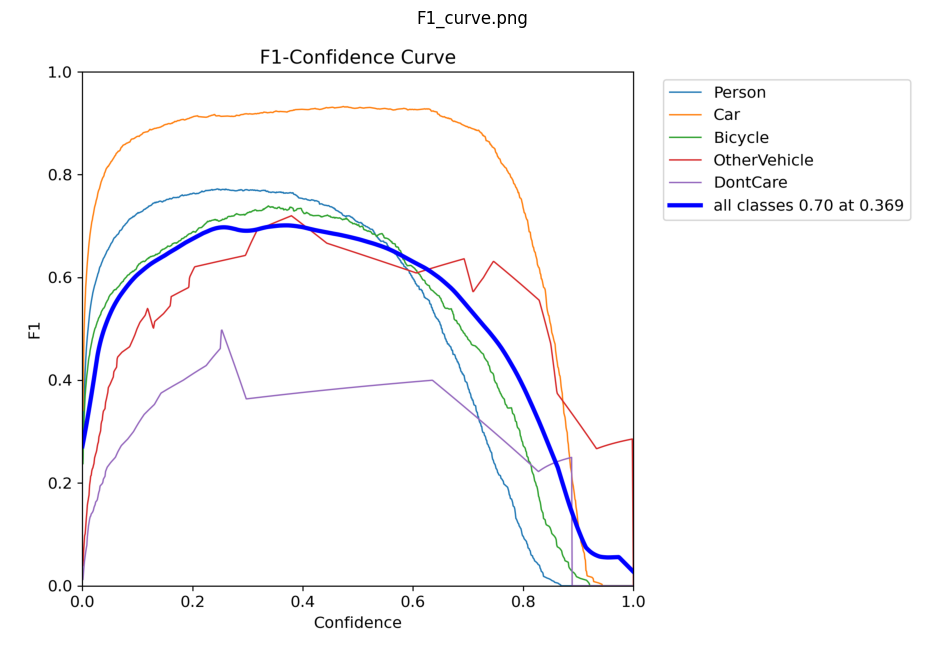

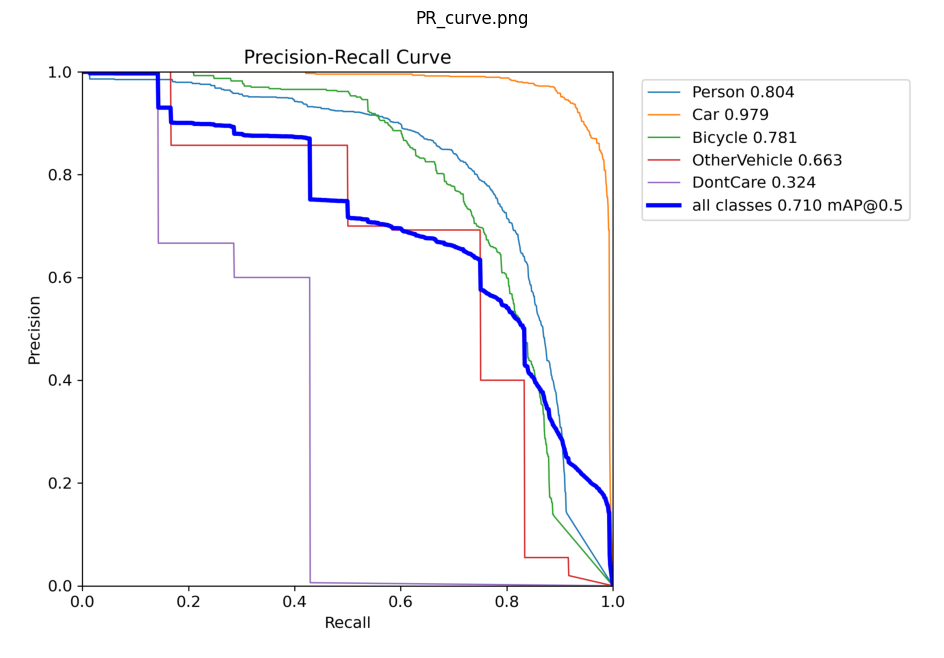

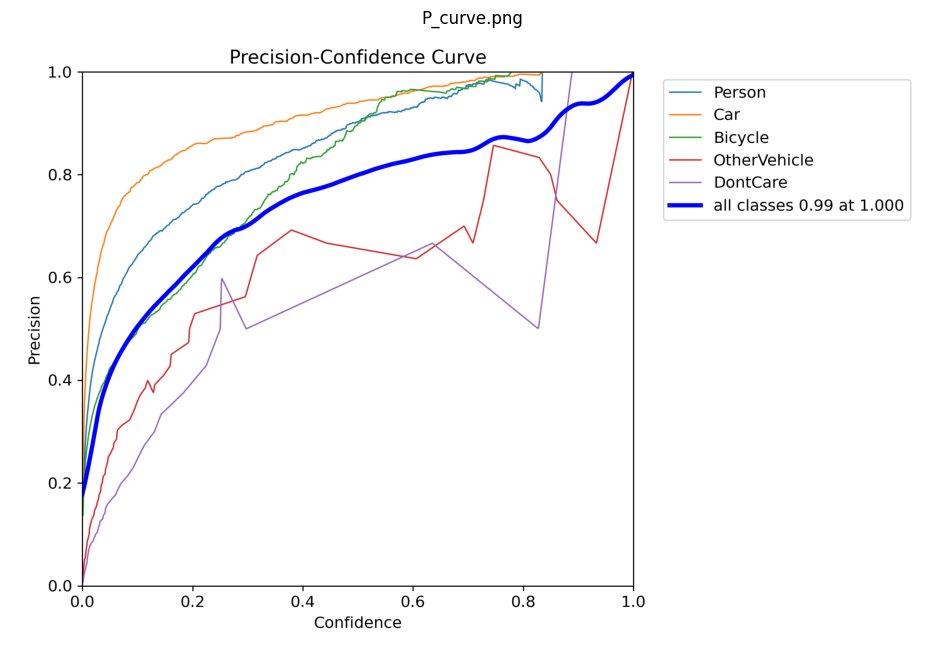

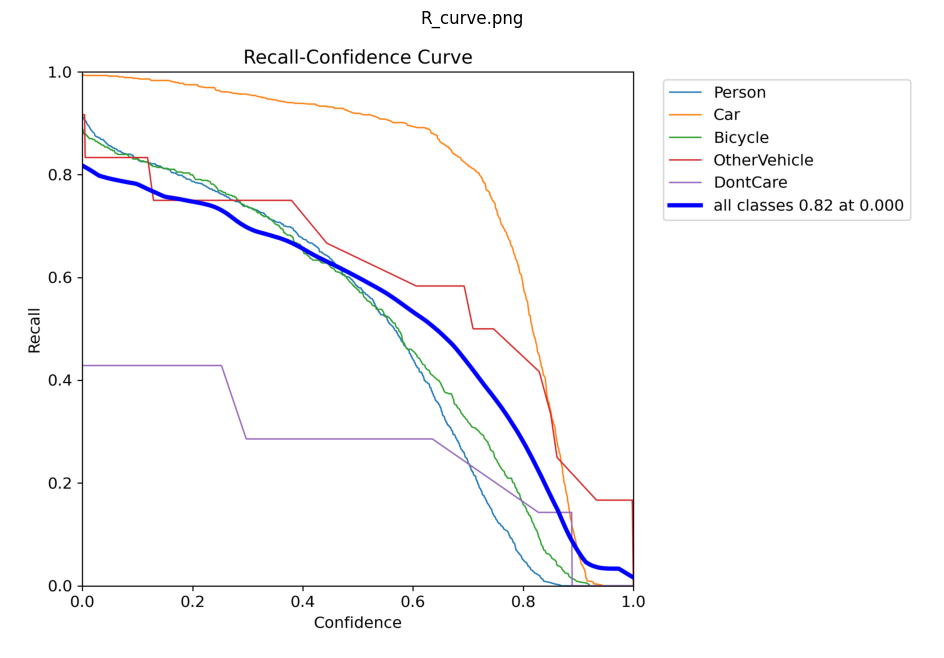

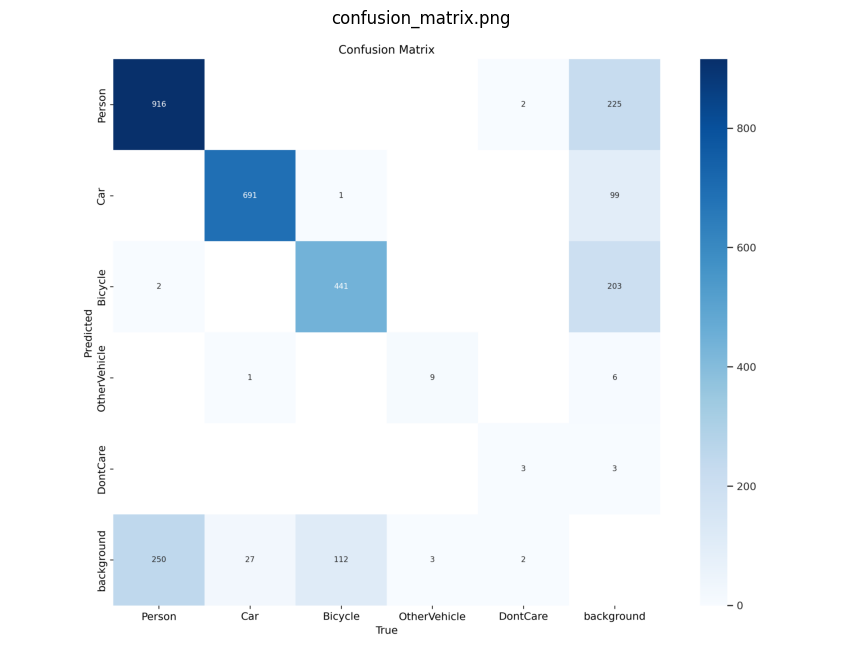

...

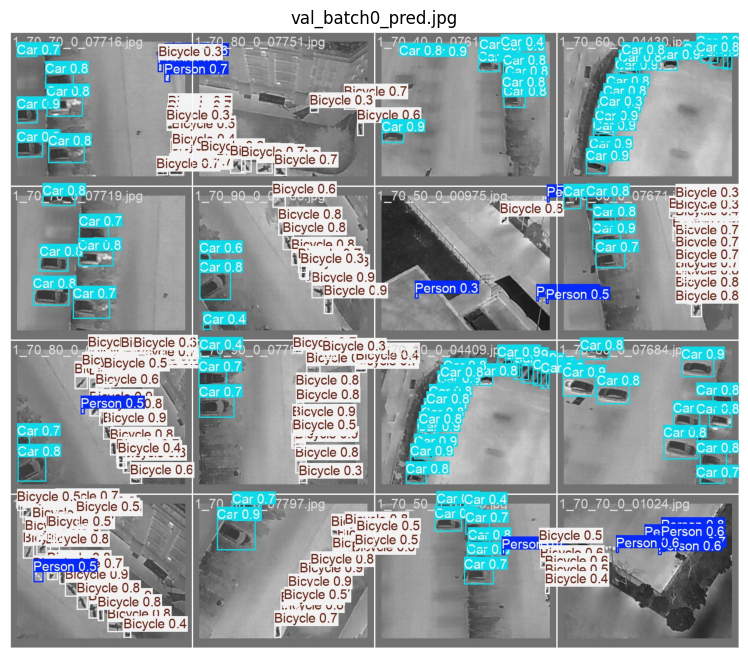

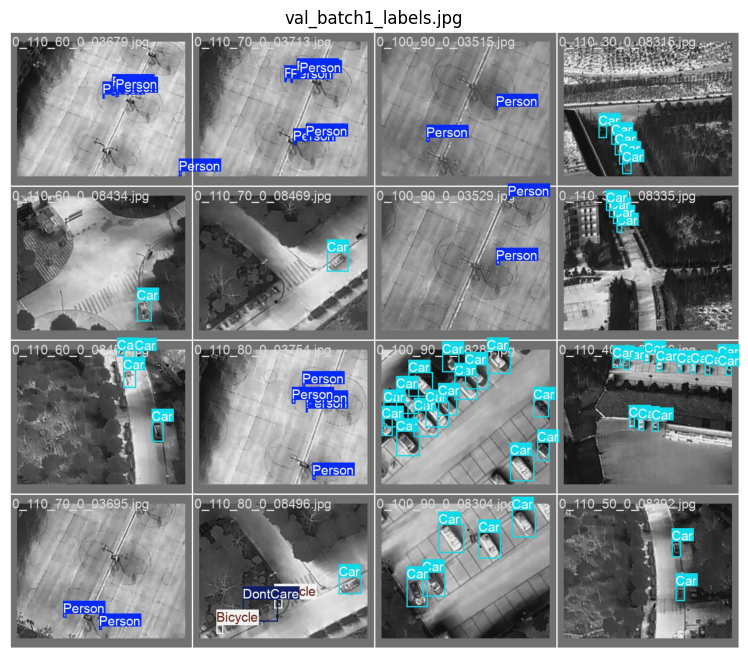

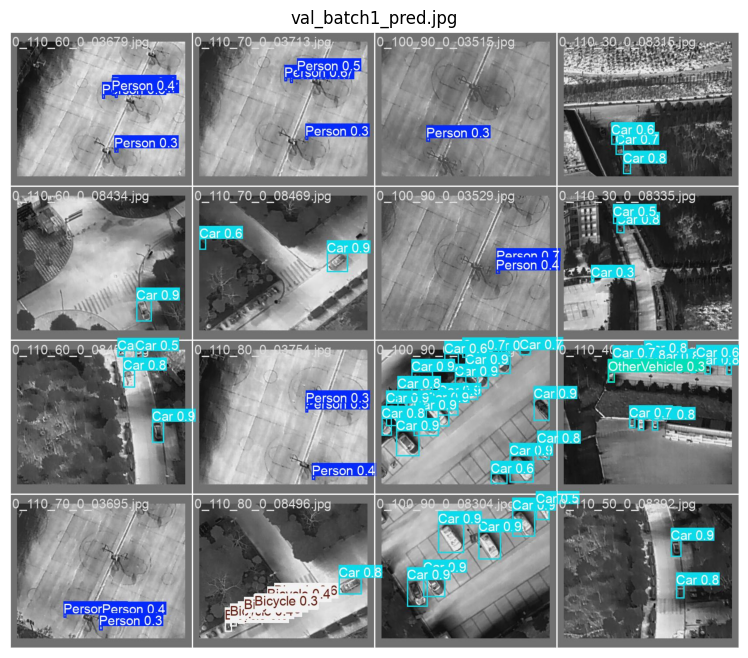

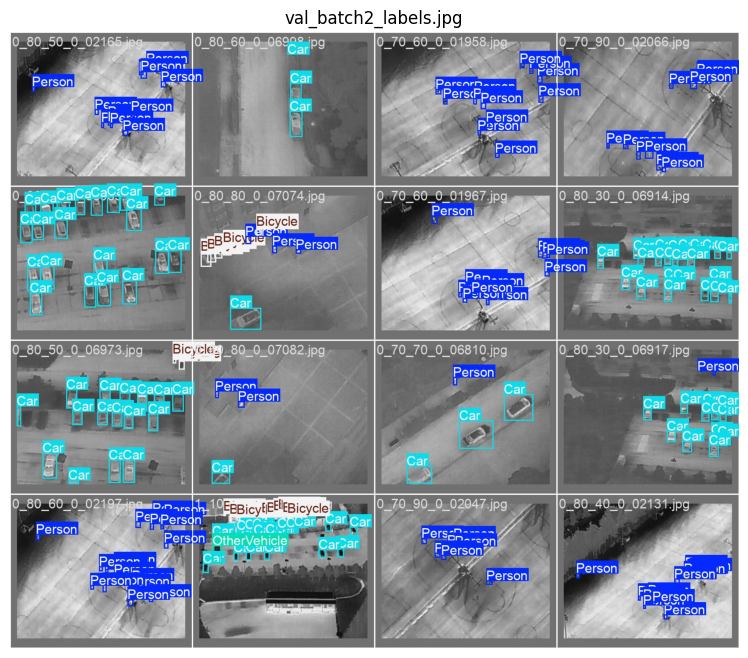

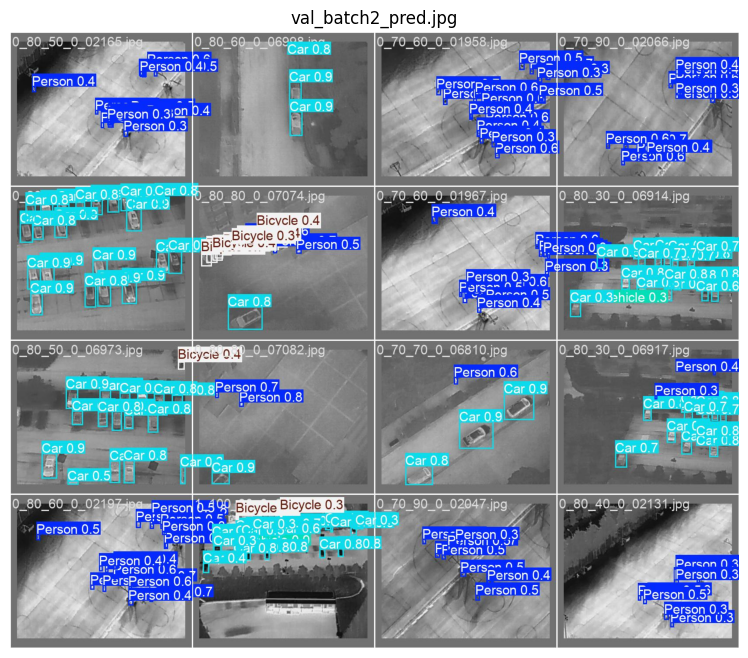

In [30]:
# Print all curves
log_dir = "runs/detect/yolo11n_50epochs"
for image_path in sorted(paths.list_images(log_dir)):
    image = Image.open(image_path)
    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    plt.title(os.path.basename(image_path))
    plt.axis('off')
    plt.show()

## Inference on Test Images

In [12]:
# Test the model on test set
results = model(test_imgs_dir, conf=0.5, agnostic_nms=True, iou=0.5, save=True)


image 1/571 /home/ashish/Projects/thermal-analysis/dataset/images/test/0_100_30_0_03307.jpg: 320x384 8 Cars, 33.6ms
image 2/571 /home/ashish/Projects/thermal-analysis/dataset/images/test/0_100_30_0_08074.jpg: 320x384 8 Cars, 10.0ms
image 3/571 /home/ashish/Projects/thermal-analysis/dataset/images/test/0_100_30_0_08091.jpg: 320x384 8 Cars, 11.7ms
image 4/571 /home/ashish/Projects/thermal-analysis/dataset/images/test/0_100_30_0_08100.jpg: 320x384 3 Cars, 19.8ms
image 5/571 /home/ashish/Projects/thermal-analysis/dataset/images/test/0_100_40_0_03327.jpg: 320x384 2 Persons, 19.7ms
image 6/571 /home/ashish/Projects/thermal-analysis/dataset/images/test/0_100_40_0_03332.jpg: 320x384 2 Persons, 9.1ms
image 7/571 /home/ashish/Projects/thermal-analysis/dataset/images/test/0_100_40_0_03342.jpg: 320x384 2 Persons, 6.5ms
image 8/571 /home/ashish/Projects/thermal-analysis/dataset/images/test/0_100_40_0_03347.jpg: 320x384 (no detections), 6.5ms
image 9/571 /home/ashish/Projects/thermal-analysis/datas

## Comparing with Ground Truth

In [31]:
# Setting ground colors
ground_colors = [(255, 0, 0) for _ in range(len(classes))]

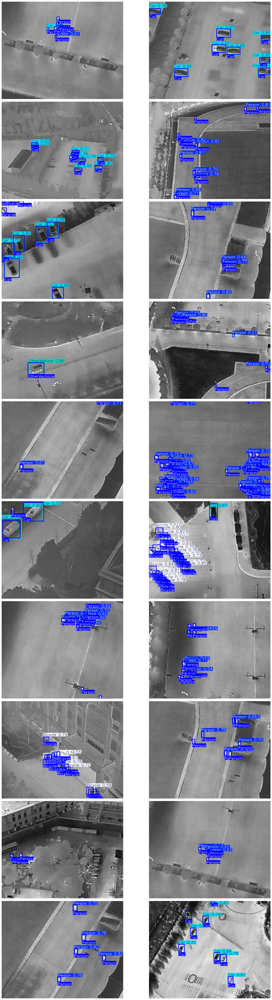

In [32]:
# Comparing a few testing images.
plot(
    image_path='runs/detect/yolo11n_50epochs2', 
    label_path=test_labels_dir,
    num_samples=20,
    classes=classes,
    colors=ground_colors,
    pos='below'
)

## Saving the model weights

In [15]:
save = model.export(format="onnx")  # export the model to ONNX format
save

Ultralytics 8.3.48 🚀 Python-3.12.7 torch-2.5.1+cu118 CPU (AMD Ryzen 7 7800X3D 8-Core Processor)

PyTorch: starting from 'runs/detect/yolo11n_50epochs/weights/best.pt' with input shape (1, 3, 384, 384) BCHW and output shape(s) (1, 9, 3024) (5.2 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0', 'onnxslim', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 10.4 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 291.5/291.5 MB 29.0 MB/s eta 0:00:0000:0100:01

requirements: AutoUpdate success ✅ 18.8s, installed 3 packages: ['onnx>=1.12.0', 'onnxslim', 'onnxruntime-gpu']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: slimming with onnxslim 0.1.43...
ONNX: export success ✅ 18.0s, saved as 'runs/detect/yolo11n_50epochs/weights/best.onnx' (10.0 MB)

Export complete (19.3s)
Results saved to /home/ashish/Projects/therma

'runs/detect/yolo11n_50epochs/weights/best.onnx'